In [ ]:
# Install required packages
!pip install xgboost
!pip install seaborn
!pip install gym
!pip install stable-baselines3
!pip install pybullet
!pip install gymnasium
!pip install tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.5/184.5 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 53.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 30.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 99.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalli

In [ ]:
import tensorflow as tf
from google.colab import drive
drive.mount('/content/drive')
data_path = '/content/drive/MyDrive/EVD/data/'

Mounted at /content/drive


In [ ]:
import time
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import matplotlib.pyplot as plt
import pickle
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
from collections import deque
import random
from sklearn.mixture import GaussianMixture
import gymnasium as gym
from gymnasium import spaces
from stable_baselines3 import SAC
from stable_baselines3.common.env_checker import check_env
from stable_baselines3.common.callbacks import BaseCallback

# Load the dataset
df = pd.read_csv(data_path + "helsinki_ev_data_price.csv")

In [ ]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

In [ ]:
import time
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import matplotlib.pyplot as plt
import pickle
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
from collections import deque
import random
from sklearn.mixture import GaussianMixture
import gymnasium as gym
from gymnasium import spaces
from stable_baselines3 import SAC
from stable_baselines3.common.env_checker import check_env
from stable_baselines3.common.callbacks import BaseCallback

# Load the dataset
df = pd.read_csv(data_path + "helsinki_ev_data_price.csv")
# Shuffle the dataset
df_shuffled = df.sample(frac=1, random_state=42).reset_index(drop=True)

# Select the first 30,000 samples
df_subset = df_shuffled.head(30000)

# Define features and target
features_to_drop = ['Day','Time (HH:MM:SS)', 'Charging_Event (Count)', 'Charging_Demand (kWh)']
X = df_subset.drop(features_to_drop, axis=1)
#y = df_subset['Charging_Demand (kWh)']
y = df_subset['Charging_Demand (kWh)'].astype(float)  # Explicitly convert to flo

# Normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X = pd.DataFrame(X_scaled, columns=X.columns)

# After loading data
expected_features = ['Region_ID', 'Total_Energy_Consumption (kWh)',
                    'Avg_EV_Count', 'Avg_Remaining_Battery (%)',
                    'Avg_Remaining_Trip_Duration (min)',
                    'Avg_Remaining_Trip_Distance (km)',
                    'Price_per_kWh (EUR)']
assert set(X.columns) == set(expected_features), "Feature mismatch!"

# Initialize k-fold cross-validation
k_folds = 10
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Enhanced EVChargingEnv class with XGBoost integration
class EnhancedEVChargingEnv(gym.Env):
    def __init__(self, xgboost_model, X_data, y_data, scaler):
        super(EnhancedEVChargingEnv, self).__init__()
        self.xgboost_model = xgboost_model
        self.X_data = X_data.values
        self.X_data_columns = X_data.columns  # Store column names
        self.y_data = y_data.values
        self.scaler = scaler
        self.current_idx = 0

        # Enhanced price parameters
        self.P_base = 0.25   # EUR/kWh
        self.P_min = 0.20
        self.P_max = 0.40
        self.alpha = 0.15

        # Initialize current_price
        self.current_price = self.P_base

        # Smoothing buffers
        self.price_memory = deque(maxlen=5)  # For action smoothing
        self.demand_memory = deque(maxlen=3) # For demand smoothing

        # Enhanced constraints
        self.max_daily_price_change = 0.10  # Max 10% daily variation
        self.target_load = np.mean(y_data)
        self.L_th = self.target_load * 1.5

        # Observation/action spaces
        self.observation_space = spaces.Box(
            low=np.array([0, 0, 0, 0, 0, 0, self.P_min]),
            high=np.array([np.inf, np.inf, 100, np.inf, np.inf, np.inf, self.P_max]),
            dtype=np.float32
        )
        self.action_space = spaces.Box(low=-1.0, high=1.0, shape=(1,), dtype=np.float32)

        # Enhanced driver behavior model
        self.n_clusters = 3
        self.gmm = GaussianMixture(n_components=self.n_clusters)
        demands = self.y_data.reshape(-1, 1)
        self.gmm.fit(demands)
        self.gamma_k = np.array([0.8, 0.5, 0.3])  # Price sensitivity coefficients

        # Add demand tracking
        self.demand_history = []
        self.deviation_history = []
        self.target_load = np.mean(y_data)

    def _fit_driver_model(self):
        """Fit Gaussian Mixture Model to historical demand data"""
        demands = self.y_data.reshape(-1, 1)
        self.gmm.fit(demands)

    def _get_driver_response(self, price_change):
        """Simulate driver response to price change using GMM"""
        L_base, cluster = self.gmm.sample()
        L_base = L_base[0, 0]
        gamma = self.gamma_k[cluster[0]]
        L_t = L_base * (1 - gamma * price_change)
        return max(0, L_t)

    def _get_state(self, features):
        try:
            features_df = pd.DataFrame([features], columns=self.X_data_columns)
            dmatrix = xgb.DMatrix(features_df)
            predicted_demand = self.xgboost_model.predict(dmatrix)[0]
            return np.array([
                predicted_demand, 1.0, 50.0, 20.0, 12.0, 1.0, self.current_price
            ], dtype=np.float32)
        except Exception as e:
            print(f"Error in _get_state: {str(e)}")
            print(f"Features: {features}")
            print(f"Expected columns: {self.X_data_columns}")
            raise

    def _enhanced_reward(self, current_demand, previous_demand, price_change, deviation):
        """New reward with demand growth penalty"""
        demand_growth_penalty = -0.5 * max(0, current_demand - previous_demand)
        reward = (
            -0.7 * (deviation ** 2) +
            -0.3 * (price_change ** 2) +
            -1.5 * max(0, current_demand - self.target_load) +
            demand_growth_penalty
        )
        if abs(price_change) > self.max_daily_price_change:
            reward -= 0.5 * (abs(price_change) - self.max_daily_price_change) ** 2
        return reward

    def step(self, action):
        # Action smoothing
        self.price_memory.append(action[0])
        smoothed_action = np.mean(self.price_memory)

        # Price adjustment
        price_adjustment = smoothed_action * 1.5
        new_price = self.P_base + self.alpha * price_adjustment
        new_price = np.clip(new_price, self.P_min, self.P_max)
        price_change = (new_price - self.current_price)/self.current_price

        # Get driver response
        price_change_pct = (new_price - self.P_base)/self.P_base
        actual_demand = self._get_driver_response(price_change_pct)
        self.demand_memory.append(actual_demand)

        # Calculate reward
        deviation = actual_demand - self.target_load
        reward = self._enhanced_reward(
            actual_demand,
            self.demand_memory[-2] if len(self.demand_memory) > 1 else actual_demand,
            price_change,
            deviation
        )

        # Store demand and deviation
        self.demand_history.append(actual_demand)
        self.deviation_history.append(deviation)

        # Update state
        self.current_idx = (self.current_idx + 1) % len(self.X_data)
        next_state = self._get_state(self.X_data[self.current_idx])
        next_state[-1] = new_price
        self.current_state = next_state
        self.current_price = new_price

        return next_state, reward, False, False, {
            'price': new_price,
            'demand': actual_demand,
            'deviation': deviation,
            'target_demand': self.target_load
        }

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.current_idx = 0
        self.current_state = self._get_state(self.X_data[self.current_idx])
        self.current_price = self.P_base
        return self.current_state, {}

# XGBoost parameters
params = {
    'objective': 'reg:squarederror',
    'eval_metric': 'rmse',
    'eta': 0.01,
    'max_depth': 6,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'alpha': 0.1,
    'lambda': 0.1,
    'seed': 42,
    'nthread': -1,
    'tree_method': 'hist',  # Changed from gpu_hist
    'device': 'cuda' if device_name else 'cpu'  # New recommended way
}

# Initialize results storage
xgb_rl_results = {
    'train_loss': [], 'val_loss': [], 'train_r2': [], 'val_r2': [],
    'train_mae': [], 'val_mae': [], 'train_rmse': [], 'val_rmse': [],
    'test_metrics': [], 'test_predictions': [], 'feature_importances': [],
    'training_times': [], 'best_iterations': [], 'rl_rewards': [],
    'rl_prices': [], 'rl_demands': [], 'sac_losses': []
}

# K-fold cross-validation loop with RL integration
for fold, (train_idx, test_idx) in enumerate(kf.split(X)):
    print(f"\n=== Fold {fold + 1}/{k_folds} ===")

    # Split data
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    # Further split into train/val
    val_size = 0.15
    split_idx = int(len(X_train) * (1 - val_size))
    X_train_fold, X_val_fold = X_train[:split_idx], X_train[split_idx:]
    y_train_fold, y_val_fold = y_train[:split_idx], y_train[split_idx:]

    # Create DMatrix for XGBoost
    dtrain = xgb.DMatrix(X_train_fold, label=y_train_fold)
    dval = xgb.DMatrix(X_val_fold, label=y_val_fold)
    dtest = xgb.DMatrix(X_test, label=y_test)

    # Time the training
    start_time = time.time()

    # Train XGBoost model with early stopping
    evals_result = {}
    model = xgb.train(
        params,
        dtrain,
        num_boost_round=1000,
        evals=[(dtrain, 'train'), (dval, 'val')],
        early_stopping_rounds=100,
        evals_result=evals_result,
        verbose_eval=100
    )

    end_time = time.time()
    fold_time = end_time - start_time
    xgb_rl_results['training_times'].append(fold_time)
    xgb_rl_results['best_iterations'].append(model.best_iteration)

    print(f"Training time for fold {fold + 1}: {fold_time:.2f} seconds")
    print(f"Best iteration: {model.best_iteration}")

    # Store training history
    xgb_rl_results['train_loss'].append(evals_result['train']['rmse'])
    xgb_rl_results['val_loss'].append(evals_result['val']['rmse'])

    # Calculate metrics
    def calculate_metrics(X, y_true):
        y_pred = model.predict(xgb.DMatrix(X))
        return {
            'r2': r2_score(y_true, y_pred),
            'mae': mean_absolute_error(y_true, y_pred),
            'rmse': np.sqrt(mean_squared_error(y_true, y_pred))
        }

    # Training metrics
    train_metrics = calculate_metrics(X_train_fold, y_train_fold)
    xgb_rl_results['train_r2'].append([train_metrics['r2']] * len(evals_result['train']['rmse']))
    xgb_rl_results['train_mae'].append([train_metrics['mae']] * len(evals_result['train']['rmse']))
    xgb_rl_results['train_rmse'].append([train_metrics['rmse']] * len(evals_result['train']['rmse']))

    # Validation metrics
    val_metrics = calculate_metrics(X_val_fold, y_val_fold)
    xgb_rl_results['val_r2'].append([val_metrics['r2']] * len(evals_result['val']['rmse']))
    xgb_rl_results['val_mae'].append([val_metrics['mae']] * len(evals_result['val']['rmse']))
    xgb_rl_results['val_rmse'].append([val_metrics['rmse']] * len(evals_result['val']['rmse']))

    # Test evaluation
    test_pred = model.predict(dtest)
    xgb_rl_results['test_predictions'].append(test_pred)

    test_metrics = {
        'mae': mean_absolute_error(y_test, test_pred),
        'rmse': np.sqrt(mean_squared_error(y_test, test_pred)),
        'r2': r2_score(y_test, test_pred)
    }
    xgb_rl_results['test_metrics'].append(test_metrics)

    # Feature importance
    xgb_rl_results['feature_importances'].append(model.get_score(importance_type='gain'))

    print(f"\nFold {fold + 1} Test Metrics:")
    print(f"MAE: {test_metrics['mae']:.4f}, RMSE: {test_metrics['rmse']:.4f}, R²: {test_metrics['r2']:.4f}")

    # Initialize RL environment with XGBoost model
    env = EnhancedEVChargingEnv(model, X_val_fold, y_val_fold, scaler)
    check_env(env)

    # Enhanced SAC agent with modified parameters
    sac_agent = SAC(
        'MlpPolicy',
        env,
        verbose=1,
        device='cuda' if torch.cuda.is_available() else 'cpu',
        learning_rate=3e-4,
        buffer_size=300000,
        batch_size=1024,
        ent_coef='auto',
        gamma=0.99,
        tau=0.005,
        policy_kwargs=dict(net_arch=[256, 256])
    )

    # Custom callback to track rewards and prices
    class CustomCallback(BaseCallback):
        def __init__(self, verbose=0):
            super(CustomCallback, self).__init__(verbose)
            self.rewards = []
            self.prices = []
            self.demands = []

        def _on_step(self) -> bool:
            info = self.locals['infos'][0]
            self.rewards.append(self.locals['rewards'][0])
            self.prices.append(info['price'])
            self.demands.append(info['demand'])
            return True

    callback = CustomCallback()

    # Train the SAC agent
    sac_agent.learn(total_timesteps=50000, callback=callback)

    # Store RL results
    xgb_rl_results['rl_rewards'].append(callback.rewards)
    xgb_rl_results['rl_prices'].append(callback.prices)
    xgb_rl_results['rl_demands'].append(callback.demands)

    print(f"\nRL Training completed for fold {fold + 1}")
    print(f"Average Reward: {np.mean(callback.rewards):.2f}")
    print(f"Price Range: {np.min(callback.prices):.3f}-{np.max(callback.prices):.3f} EUR/kWh")
    print(f"Average Demand: {np.mean(callback.demands):.2f} kWh")

# Calculate and display final results
avg_test_mae = np.mean([res['mae'] for res in xgb_rl_results['test_metrics']])
avg_test_rmse = np.mean([res['rmse'] for res in xgb_rl_results['test_metrics']])
avg_test_r2 = np.mean([res['r2'] for res in xgb_rl_results['test_metrics']])
avg_training_time = np.mean(xgb_rl_results['training_times'])
avg_iterations = np.mean(xgb_rl_results['best_iterations'])

# Calculate RL metrics
all_prices = np.concatenate(xgb_rl_results['rl_prices'])
all_demands = np.concatenate(xgb_rl_results['rl_demands'])
price_elasticity = np.corrcoef(all_prices, all_demands)[0, 1]

print("\n=== Final XGBoost with RL Cross-Validation Results ===")
print(f"Average Test MAE across {k_folds} folds: {avg_test_mae:.4f}")
print(f"Average Test RMSE across {k_folds} folds: {avg_test_rmse:.4f}")
print(f"Average Test R² across {k_folds} folds: {avg_test_r2:.4f}")
print(f"\nAverage XGBoost training time: {avg_training_time:.2f} seconds")
print(f"Average best iterations: {avg_iterations:.1f}")
print(f"\nRL Performance Summary:")
print(f"Average Price: {np.mean(all_prices):.3f} ± {np.std(all_prices):.3f} EUR/kWh")
print(f"Price Elasticity: {price_elasticity:.3f}")
print(f"Average Demand: {np.mean(all_demands):.2f} kWh")

# Plotting functions (same as before, just change variable names)
def plot_demand_smoothing_comparison(original_demand, rl_demands, target_load, sample_size=1000):
    """Enhanced plot comparing original vs. RL-smoothed demand"""
    # Sample data for cleaner visualization
    sample_idx = np.linspace(0, len(rl_demands)-1, min(sample_size, len(rl_demands))).astype(int)
    sampled_original = original_demand[sample_idx]
    sampled_rl = np.array(rl_demands)[sample_idx]

    # Create figure
    plt.figure(figsize=(16, 7))

    # Plot both demand curves
    plt.plot(sample_idx, sampled_original, 'b-', alpha=0.6,
             label='Original Demand (No Price Adjustments)', linewidth=1)
    plt.plot(sample_idx, sampled_rl, 'r-', alpha=0.9,
             label='RL-Optimized Demand', linewidth=1.5)

    # Calculate key metrics
    original_std = np.std(sampled_original)
    rl_std = np.std(sampled_rl)
    smoothing_percentage = 100 * (original_std - rl_std) / original_std

    peak_reduction = 100 * (1 - np.max(sampled_rl)/np.max(sampled_original))
    avg_demand_reduction = 100 * (1 - np.mean(sampled_rl)/np.mean(sampled_original))

    # Annotate metrics
    metric_text = (
        f'Smoothing Effect: {smoothing_percentage:.1f}% volatility reduction\n'
        f'Peak Reduction: {peak_reduction:.1f}% (Max: {np.max(sampled_original):.2f} → {np.max(sampled_rl):.2f})\n'
        f'Avg Demand Change: {avg_demand_reduction:+.1f}%\n'
        f'Original STD: {original_std:.3f} → RL STD: {rl_std:.3f}'
    )

    plt.text(
        0.02, 0.95,
        metric_text,
        transform=plt.gca().transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=10,
        verticalalignment='top'
    )

    # Formatting
    plt.xlabel('Time Step', fontsize=12)
    plt.ylabel('Demand (kWh)', fontsize=12)
    plt.title('Demand Smoothing via RL Price Optimization\n'
             f'Target Load: {target_load:.2f} kWh', fontsize=14)

    plt.legend(loc='upper right', framealpha=0.9)
    plt.grid(alpha=0.2)
    plt.ylim(0, max(np.max(sampled_original)*1.1, target_load*1.5))

    plt.tight_layout()
    plt.show()

# Generate plot using last fold's results
last_fold_idx = k_folds - 1
rl_demands = xgb_rl_results['rl_demands'][last_fold_idx]
original_demand = y.values

plot_demand_smoothing_comparison(
    original_demand=original_demand,
    rl_demands=rl_demands,
    target_load=np.mean(y)
)

# Save results
def save_xgb_rl_results():
    results = {
        'avg_test_metrics': {
            'mae': avg_test_mae,
            'rmse': avg_test_rmse,
            'r2': avg_test_r2
        },
        'timing': {
            'per_fold_times': xgb_rl_results['training_times'],
            'average_time': avg_training_time,
            'per_fold_iterations': xgb_rl_results['best_iterations'],
            'average_iterations': avg_iterations
        },
        'test_results': {
            'y_true': np.concatenate([y.iloc[test_idx] for _, test_idx in kf.split(X)]),
            'y_pred': np.concatenate(xgb_rl_results['test_predictions']),
            'metrics': xgb_rl_results['test_metrics']
        },
        'rl_results': {
            'rewards': xgb_rl_results['rl_rewards'],
            'prices': xgb_rl_results['rl_prices'],
            'demands': xgb_rl_results['rl_demands'],
            'price_stats': {
                'mean': np.mean(all_prices),
                'std': np.std(all_prices),
                'min': np.min(all_prices),
                'max': np.max(all_prices)
            },
            'elasticity': price_elasticity
        },
        'feature_importances': {
            'importances': xgb_rl_results['feature_importances'],
            'feature_names': list(X.columns)
        },
        'metadata': {
            'model_type': 'XGBoost with SAC Pricing',
            'parameters': params,
            'env_parameters': {
                'P_base': 0.25,
                'P_min': 0.20,
                'P_max': 0.40,
                'gamma_k': [0.8, 0.5, 0.3]
            },
            'timestamp': pd.Timestamp.now().isoformat()
        }
    }

    # Save to file
    with open(f'{data_path}saved_predictions/xgboost_rl_50000_Step_30000_data_results.pkl', 'wb') as f:
        pickle.dump(results, f)

    print("Enhanced XGBoost with RL results saved successfully!")

save_xgb_rl_results()


=== Fold 1/10 ===
[0]	train-rmse:0.30290	val-rmse:0.30004
[100]	train-rmse:0.15024	val-rmse:0.15121
[200]	train-rmse:0.10860	val-rmse:0.11274
[300]	train-rmse:0.09912	val-rmse:0.10540
[400]	train-rmse:0.09618	val-rmse:0.10403
[500]	train-rmse:0.09463	val-rmse:0.10370
[600]	train-rmse:0.09342	val-rmse:0.10368
[636]	train-rmse:0.09304	val-rmse:0.10369
Training time for fold 1: 2.62 seconds
Best iteration: 537

Fold 1 Test Metrics:
MAE: 0.0810, RMSE: 0.1068, R²: 0.8785


/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 1
Average Reward: -0.18
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.29 kWh

=== Fold 2/10 ===
[0]	train-rmse:0.30369	val-rmse:0.30262
[100]	train-rmse:0.15061	val-rmse:0.15331
[200]	train-rmse:0.10896	val-rmse:0.11435
[300]	train-rmse:0.09953	val-rmse:0.10667
[400]	train-rmse:0.09666	val-rmse:0.10508
[500]	train-rmse:0.09513	val-rmse:0.10475
[600]	train-rmse:0.09389	val-rmse:0.10470
[700]	train-rmse:0.09282	val-rmse:0.10464
[784]	train-rmse:0.09201	val-rmse:0.10466
Training time for fold 2: 2.09 seconds
Best iteration: 685

Fold 2 Test Metrics:
MAE: 0.0771, RMSE: 0.1029, R²: 0.8797


/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 2
Average Reward: -0.22
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.31 kWh

=== Fold 3/10 ===
[0]	train-rmse:0.30343	val-rmse:0.29881
[100]	train-rmse:0.15067	val-rmse:0.15139
[200]	train-rmse:0.10913	val-rmse:0.11320
[300]	train-rmse:0.09972	val-rmse:0.10574
[400]	train-rmse:0.09684	val-rmse:0.10415
[500]	train-rmse:0.09528	val-rmse:0.10380
[600]	train-rmse:0.09410	val-rmse:0.10371
[700]	train-rmse:0.09301	val-rmse:0.10363
[800]	train-rmse:0.09202	val-rmse:0.10359
[900]	train-rmse:0.09105	val-rmse:0.10361
[902]	train-rmse:0.09104	val-rmse:0.10361
Training time for fold 3: 2.37 seconds
Best iteration: 803

Fold 3 Test Metrics:
MAE: 0.0784, RMSE: 0.1029, R²: 0.8856


/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 3
Average Reward: -0.16
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.30 kWh

=== Fold 4/10 ===
[0]	train-rmse:0.30405	val-rmse:0.29928
[100]	train-rmse:0.15080	val-rmse:0.15147
[200]	train-rmse:0.10899	val-rmse:0.11322
[300]	train-rmse:0.09952	val-rmse:0.10587
[400]	train-rmse:0.09658	val-rmse:0.10441
[500]	train-rmse:0.09506	val-rmse:0.10415
[600]	train-rmse:0.09385	val-rmse:0.10407
[700]	train-rmse:0.09272	val-rmse:0.10403
[800]	train-rmse:0.09175	val-rmse:0.10399
[900]	train-rmse:0.09079	val-rmse:0.10407
[909]	train-rmse:0.09071	val-rmse:0.10408
Training time for fold 4: 2.33 seconds
Best iteration: 809

Fold 4 Test Metrics:
MAE: 0.0774, RMSE: 0.1043, R²: 0.8779


/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 4
Average Reward: -0.24
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.31 kWh

=== Fold 5/10 ===
[0]	train-rmse:0.30332	val-rmse:0.30120
[100]	train-rmse:0.15055	val-rmse:0.15201
[200]	train-rmse:0.10897	val-rmse:0.11378
[300]	train-rmse:0.09952	val-rmse:0.10657
[400]	train-rmse:0.09661	val-rmse:0.10525
[500]	train-rmse:0.09506	val-rmse:0.10496
[600]	train-rmse:0.09383	val-rmse:0.10492
[700]	train-rmse:0.09274	val-rmse:0.10492
[800]	train-rmse:0.09174	val-rmse:0.10493
[815]	train-rmse:0.09159	val-rmse:0.10492
Training time for fold 5: 2.06 seconds
Best iteration: 715

Fold 5 Test Metrics:
MAE: 0.0767, RMSE: 0.1021, R²: 0.8855


/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 5
Average Reward: -0.15
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.30 kWh

=== Fold 6/10 ===
[0]	train-rmse:0.30454	val-rmse:0.29763
[100]	train-rmse:0.15110	val-rmse:0.15113
[200]	train-rmse:0.10930	val-rmse:0.11357
[300]	train-rmse:0.09988	val-rmse:0.10643
[400]	train-rmse:0.09701	val-rmse:0.10509
[500]	train-rmse:0.09547	val-rmse:0.10479
[600]	train-rmse:0.09426	val-rmse:0.10473
[700]	train-rmse:0.09321	val-rmse:0.10467
[763]	train-rmse:0.09258	val-rmse:0.10468
Training time for fold 6: 1.93 seconds
Best iteration: 664

Fold 6 Test Metrics:
MAE: 0.0758, RMSE: 0.0996, R²: 0.8875
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(



RL Training completed for fold 6
Average Reward: -0.21
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.31 kWh

=== Fold 7/10 ===
[0]	train-rmse:0.30271	val-rmse:0.29955
[100]	train-rmse:0.15039	val-rmse:0.15190
[200]	train-rmse:0.10889	val-rmse:0.11386
[300]	train-rmse:0.09950	val-rmse:0.10662
[400]	train-rmse:0.09659	val-rmse:0.10531
[500]	train-rmse:0.09506	val-rmse:0.10501
[600]	train-rmse:0.09388	val-rmse:0.10490
[700]	train-rmse:0.09277	val-rmse:0.10479
[800]	train-rmse:0.09171	val-rmse:0.10472
[864]	train-rmse:0.09107	val-rmse:0.10474
Training time for fold 7: 2.14 seconds
Best iteration: 765

Fold 7 Test Metrics:
MAE: 0.0780, RMSE: 0.1027, R²: 0.8893


/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 7
Average Reward: -0.24
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.31 kWh

=== Fold 8/10 ===
[0]	train-rmse:0.30124	val-rmse:0.30147
[100]	train-rmse:0.14996	val-rmse:0.15248
[200]	train-rmse:0.10889	val-rmse:0.11361
[300]	train-rmse:0.09964	val-rmse:0.10607
[400]	train-rmse:0.09679	val-rmse:0.10456
[500]	train-rmse:0.09525	val-rmse:0.10421
[600]	train-rmse:0.09401	val-rmse:0.10411
[689]	train-rmse:0.09307	val-rmse:0.10412
Training time for fold 8: 1.75 seconds
Best iteration: 589

Fold 8 Test Metrics:
MAE: 0.0771, RMSE: 0.1029, R²: 0.8946


/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 8
Average Reward: -0.24
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.32 kWh

=== Fold 9/10 ===
[0]	train-rmse:0.30155	val-rmse:0.29912
[100]	train-rmse:0.14969	val-rmse:0.15116
[200]	train-rmse:0.10836	val-rmse:0.11301
[300]	train-rmse:0.09902	val-rmse:0.10570
[400]	train-rmse:0.09610	val-rmse:0.10432
[500]	train-rmse:0.09459	val-rmse:0.10395
[600]	train-rmse:0.09344	val-rmse:0.10387
[700]	train-rmse:0.09246	val-rmse:0.10388
[709]	train-rmse:0.09237	val-rmse:0.10387
Training time for fold 9: 1.89 seconds
Best iteration: 609

Fold 9 Test Metrics:
MAE: 0.0811, RMSE: 0.1087, R²: 0.8828


/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 9
Average Reward: -0.17
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.31 kWh

=== Fold 10/10 ===
[0]	train-rmse:0.30306	val-rmse:0.30086
[100]	train-rmse:0.15047	val-rmse:0.15235
[200]	train-rmse:0.10898	val-rmse:0.11372
[300]	train-rmse:0.09965	val-rmse:0.10609
[400]	train-rmse:0.09675	val-rmse:0.10449
[500]	train-rmse:0.09524	val-rmse:0.10409
[600]	train-rmse:0.09406	val-rmse:0.10397
[700]	train-rmse:0.09298	val-rmse:0.10388
[800]	train-rmse:0.09198	val-rmse:0.10388
[861]	train-rmse:0.09140	val-rmse:0.10392
Training time for fold 10: 2.19 seconds
Best iteration: 761

Fold 10 Test Metrics:
MAE: 0.0777, RMSE: 0.1025, R²: 0.8864


/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 10
Average Reward: -0.17
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.30 kWh

=== Final XGBoost with RL Cross-Validation Results ===
Average Test MAE across 10 folds: 0.0780
Average Test RMSE across 10 folds: 0.1035
Average Test R² across 10 folds: 0.8848

Average XGBoost training time: 2.14 seconds
Average best iterations: 693.7

RL Performance Summary:
Average Price: 0.372 ± 0.056 EUR/kWh
Price Elasticity: -0.201
Average Demand: 0.31 kWh


IndexError: index 30029 is out of bounds for axis 0 with size 30000

In [ ]:

# Save results
def save_xgb_rl_results():
    results = {
        'avg_test_metrics': {
            'mae': avg_test_mae,
            'rmse': avg_test_rmse,
            'r2': avg_test_r2
        },
        'timing': {
            'per_fold_times': xgb_rl_results['training_times'],
            'average_time': avg_training_time,
            'per_fold_iterations': xgb_rl_results['best_iterations'],
            'average_iterations': avg_iterations
        },
        'test_results': {
            'y_true': np.concatenate([y.iloc[test_idx] for _, test_idx in kf.split(X)]),
            'y_pred': np.concatenate(xgb_rl_results['test_predictions']),
            'metrics': xgb_rl_results['test_metrics']
        },
        'rl_results': {
            'rewards': xgb_rl_results['rl_rewards'],
            'prices': xgb_rl_results['rl_prices'],
            'demands': xgb_rl_results['rl_demands'],
            'price_stats': {
                'mean': np.mean(all_prices),
                'std': np.std(all_prices),
                'min': np.min(all_prices),
                'max': np.max(all_prices)
            },
            'elasticity': price_elasticity
        },
        'feature_importances': {
            'importances': xgb_rl_results['feature_importances'],
            'feature_names': list(X.columns)
        },
        'metadata': {
            'model_type': 'XGBoost with SAC Pricing',
            'parameters': params,
            'env_parameters': {
                'P_base': 0.25,
                'P_min': 0.20,
                'P_max': 0.40,
                'gamma_k': [0.8, 0.5, 0.3]
            },
            'timestamp': pd.Timestamp.now().isoformat()
        }
    }

    # Save to file
    with open(f'{data_path}saved_predictions/xgboost_rl_50000_Step_30000_data_results.pkl', 'wb') as f:
        pickle.dump(results, f)

    print("Enhanced XGBoost with RL results saved successfully!")

save_xgb_rl_results()

Enhanced XGBoost with RL results saved successfully!


<ipython-input-2-f37043198c39>:125: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


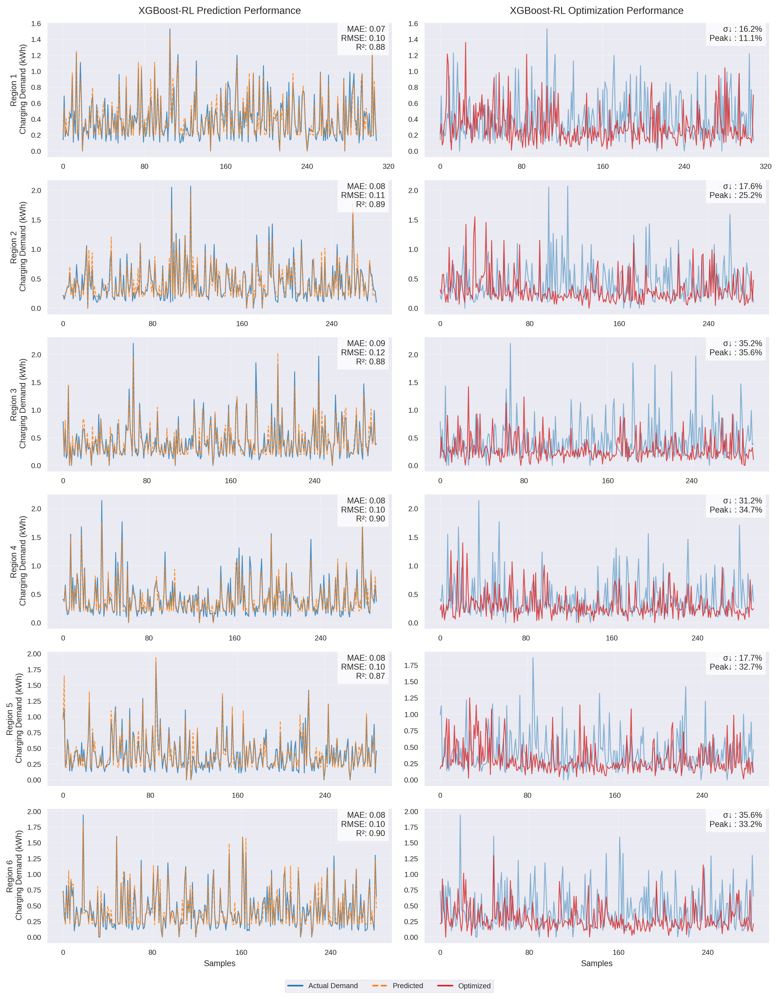


=== Model Performance Summary ===
Average MAE: 0.078 kWh
Average R²: 0.885

=== Optimization Results ===
Price Range: 0.200-0.400 €/kWh
Demand Change: -26.9%


In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
from matplotlib.ticker import MaxNLocator

# Configuration
DATA_PATH = '/content/drive/MyDrive/EVD/data/'
RESULTS_PATH = DATA_PATH + 'saved_predictions/xgboost_rl_50000_Step_30000_data_results.pkl'
N_REGIONS = 6

def load_results(file_path):
    with open(file_path, 'rb') as f:
        return pickle.load(f)

# Load data and results
df = pd.read_csv(DATA_PATH + "helsinki_ev_data_price.csv")
df_shuffled = df.sample(frac=1, random_state=42).reset_index(drop=True)
df_subset = df_shuffled.head(30000)
results = load_results(RESULTS_PATH)

# Set professional style
plt.style.use('seaborn-v0_8')
plt.rcParams.update({
    'font.size': 9,
    'axes.titlesize': 10,
    'axes.labelsize': 9,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 8,
    'grid.alpha': 0.3,
    'figure.constrained_layout.use': True
})

def plot_combined_regional_performance():
    """Combined plot of prediction and optimization performance by region"""
    # Prepare data
    y_true = results['test_results']['y_true']
    y_pred = results['test_results']['y_pred']
    rl_demands = np.concatenate(results['rl_results']['demands'])[:len(y_true)]
    region_ids = df_subset['Region_ID'].values[:len(y_true)]

    # Create figure with two columns
    fig, axs = plt.subplots(N_REGIONS, 2, figsize=(12, 2.5*N_REGIONS), dpi=300)
    #fig.suptitle('Catboost-RL Regional Performance Comparison', y=1.02, fontsize=12, fontweight='bold')

    # Column titles
    axs[0,0].set_title('XGBoost-RL Prediction Performance', pad=10, fontsize=11)
    axs[0,1].set_title('XGBoost-RL Optimization Performance', pad=10, fontsize=11)

    # Color scheme
    colors = {
        'true': '#1f77b4',  # Blue
        'pred': '#ff7f0e',  # Orange
        'opt': '#d62728'    # Red
    }

    for region_id in range(1, N_REGIONS+1):
        row_idx = region_id - 1
        region_mask = (region_ids == region_id)

        if not any(region_mask):
            axs[row_idx,0].axis('off')
            axs[row_idx,1].axis('off')
            continue

        # Get data for this region
        y_region = y_true[region_mask]
        pred_region = y_pred[region_mask]
        opt_region = rl_demands[region_mask]
        samples = np.arange(len(y_region))

        # --- Prediction Plot (Left) ---
        ax = axs[row_idx,0]
        ax.plot(samples, y_region, '-', color=colors['true'], alpha=0.8, label='Actual', linewidth=1)
        ax.plot(samples, pred_region, '--', color=colors['pred'], alpha=0.8, label='Predicted', linewidth=1)

        # Metrics
        mae = mean_absolute_error(y_region, pred_region)
        rmse = np.sqrt(mean_squared_error(y_region, pred_region))
        r2 = r2_score(y_region, pred_region)

        ax.set_ylabel(f'Region {region_id}\n Charging Demand (kWh)', fontsize=9)
        ax.text(0.98, 0.98,  # x=0.98 (right edge), y=0.98 (top edge)
                f'MAE: {mae:.2f}\nRMSE: {rmse:.2f}\nR²: {r2:.2f}',
                transform=ax.transAxes,
                ha='right',  # horizontal alignment to right
                va='top',    # vertical alignment to top
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        # --- Optimization Plot (Right) ---
        ax = axs[row_idx,1]
        ax.plot(samples, y_region, '-', color=colors['true'], alpha=0.5, label='Original', linewidth=1)
        ax.plot(samples, opt_region, '-', color=colors['opt'], alpha=0.8, label='Optimized', linewidth=1)

        # Metrics
        smoothing = 100 * (np.std(y_region) - np.std(opt_region)) / np.std(y_region)
        peak_reduction = 100 * (1 - np.max(opt_region)/np.max(y_region))

        # For the Optimization Plot (Right)
        ax.text(0.98, 0.98,  # x=0.98 (right edge), y=0.98 (top edge)
                f'σ↓ : {smoothing:.1f}%\nPeak↓ : {peak_reduction:.1f}%',
                transform=ax.transAxes,
                ha='right',  # horizontal alignment to right
                va='top',    # vertical alignment to top
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        # Common formatting for both subplots
        for col in [0,1]:
            axs[row_idx,col].xaxis.set_major_locator(MaxNLocator(5))
            axs[row_idx,col].grid(True, alpha=0.2)
            if row_idx == N_REGIONS-1:
                axs[row_idx,col].set_xlabel('Samples', fontsize=9)

    # Add legend to the bottom
    handles = [
        plt.Line2D([], [], color=colors['true'], linestyle='-', label='Actual Demand'),
        plt.Line2D([], [], color=colors['pred'], linestyle='--', label='Predicted'),
        plt.Line2D([], [], color=colors['opt'], linestyle='-', label='Optimized')
    ]
    fig.legend(handles=handles, loc='lower center', ncol=3,
               bbox_to_anchor=(0.5, -0.02), frameon=True)

    plt.tight_layout()
    plt.savefig('combined_regional_performance.pdf', bbox_inches='tight')
    plt.savefig('combined_regional_performance.png', dpi=300)
    plt.show()

# Generate the combined plot
plot_combined_regional_performance()

# Print key statistics
print("\n=== Model Performance Summary ===")
print(f"Average MAE: {results['avg_test_metrics']['mae']:.3f} kWh")
print(f"Average R²: {results['avg_test_metrics']['r2']:.3f}")
print(f"\n=== Optimization Results ===")
print(f"Price Range: {results['rl_results']['price_stats']['min']:.3f}-{results['rl_results']['price_stats']['max']:.3f} €/kWh")
demand_change = 100 * (np.mean(np.concatenate(results['rl_results']['demands'])) / np.mean(results['test_results']['y_true']) - 1)
print(f"Demand Change: {demand_change:.1f}%")

<Figure size 1600x1200 with 0 Axes>

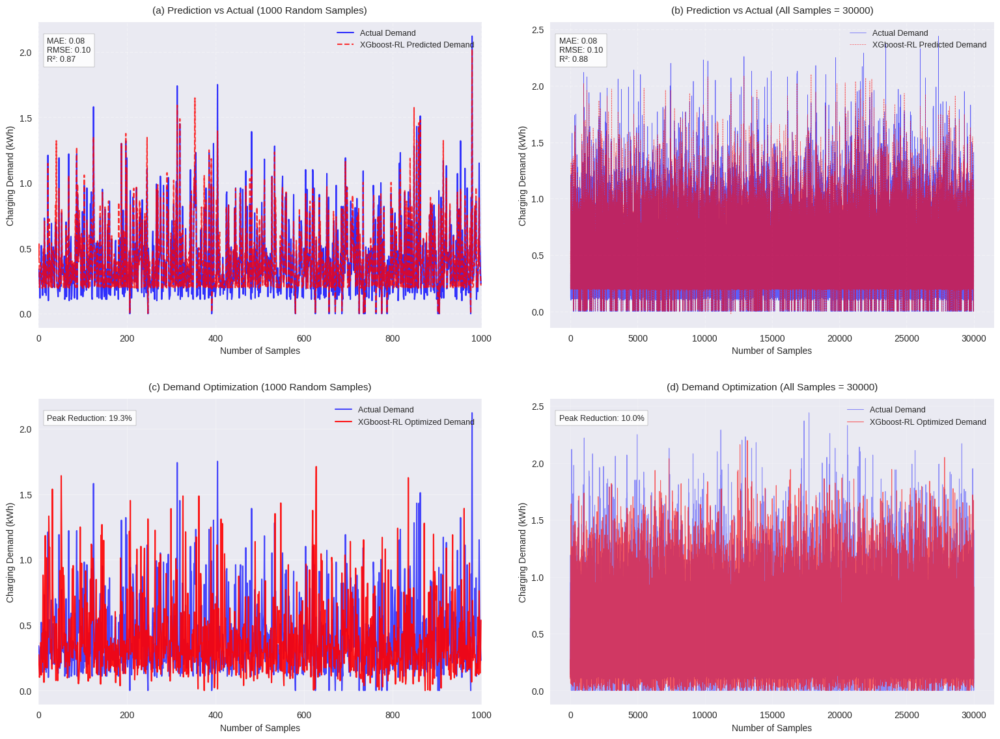


=== Model Performance Metrics ===
Average MAE: 0.0780
Average RMSE: 0.1035
Average R²: 0.8848

=== Optimization Statistics ===
Peak demand reduction: 10.0%
Average Price: 0.372 €/kWh
Price Elasticity: -0.201


In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Set up the figure and subplots
plt.figure(figsize=(16, 12))
plt.style.use('seaborn-v0_8')

# 1. Load data and results
df = pd.read_csv('/content/drive/MyDrive/EVD/data/helsinki_ev_data_price.csv')
df_subset = df.head(30000)

with open('/content/drive/MyDrive/EVD/data/saved_predictions/xgboost_rl_50000_Step_30000_data_results.pkl', 'rb') as f:
    results = pickle.load(f)

all_y_test = results['test_results']['y_true']
all_test_preds = results['test_results']['y_pred']

# Prepare data for all samples optimization plot
n_samples = len(results['test_results']['y_true'])
all_original_demand = []
all_rl_demands = []

k_folds = 10
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
X = pd.DataFrame(np.zeros((n_samples, 7)))

for fold, (_, val_idx) in enumerate(kf.split(X)):
    original_demand_fold = all_y_test[val_idx]
    rl_demands_fold = results['rl_results']['demands'][fold]
    min_length = min(len(original_demand_fold), len(rl_demands_fold))
    all_original_demand.extend(original_demand_fold[:min_length])
    all_rl_demands.extend(rl_demands_fold[:min_length])

# Set up the figure and subplots
plt.figure(figsize=(16, 12))

# 1. (a) Top-left: Prediction comparison (first 1000 samples)
ax1 = plt.subplot(2, 2, 1)
ax1.plot(all_y_test[:1000], 'b-', linewidth=1.5, alpha=0.8, label='Actual Demand')
ax1.plot(all_test_preds[:1000], 'r--', linewidth=1.5, alpha=0.8, label='XGboost-RL Predicted Demand')
ax1.set_xlabel('Number of Samples', fontsize=10)
ax1.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax1.set_title('(a) Prediction vs Actual (1000 Random Samples)', fontsize=11, pad=10)
ax1.legend(loc='upper right', fontsize=9, framealpha=1)
ax1.grid(True, linestyle='--', alpha=0.3)
ax1.set_xlim(-1, 1001)

# Metrics for (a)
mae_1000 = mean_absolute_error(all_y_test[:1000], all_test_preds[:1000])
rmse_1000 = np.sqrt(mean_squared_error(all_y_test[:1000], all_test_preds[:1000]))
r2_1000 = r2_score(all_y_test[:1000], all_test_preds[:1000])

metrics_text_1000 = (f'MAE: {mae_1000:.2f}\nRMSE: {rmse_1000:.2f}\nR²: {r2_1000:.2f}')
ax1.text(0.02, 0.95, metrics_text_1000, transform=ax1.transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=9, verticalalignment='top')

# 2. (b) Top-right: Prediction comparison (all samples)
ax2 = plt.subplot(2, 2, 2)
ax2.plot(all_y_test, 'b-', linewidth=0.5, alpha=0.6, label='Actual Demand')
ax2.plot(all_test_preds, 'r--', linewidth=0.5, alpha=0.6, label='XGboost-RL Predicted Demand')
ax2.set_xlabel('Number of Samples', fontsize=10)
ax2.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax2.set_title('(b) Prediction vs Actual (All Samples = 30000)', fontsize=11, pad=10)
ax2.legend(loc='upper right', fontsize=9, framealpha=1)
ax2.grid(True, linestyle='--', alpha=0.3)

# Metrics for (b)
mae_all = mean_absolute_error(all_y_test, all_test_preds)
rmse_all = np.sqrt(mean_squared_error(all_y_test, all_test_preds))
r2_all = r2_score(all_y_test, all_test_preds)

metrics_text_all = (f'MAE: {mae_all:.2f}\nRMSE: {rmse_all:.2f}\nR²: {r2_all:.2f}')
ax2.text(0.02, 0.95, metrics_text_all, transform=ax2.transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=9, verticalalignment='top')

# 3. (c) Bottom-left: Demand optimization (first 1000 samples)
ax3 = plt.subplot(2, 2, 3)
ax3.plot(all_y_test[:1000], 'b-', alpha=0.7, label='Actual Demand', linewidth=1.5)
ax3.plot(results['rl_results']['demands'][0][:1000], 'r-', alpha=0.9, label='XGboost-RL Optimized Demand', linewidth=1.5)
ax3.set_xlabel('Number of Samples', fontsize=10)
ax3.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax3.set_title('(c) Demand Optimization (1000 Random Samples)', fontsize=11, pad=10)
ax3.legend(loc='upper right', fontsize=9, framealpha=1)
ax3.grid(alpha=0.3)
ax3.set_xlim(-1, 1001)

# Metrics for (c) - Only peak reduction
first_1000_actual = all_y_test[:1000]
first_1000_optimized = results['rl_results']['demands'][0][:1000]
peak_reduction_1000 = 100 * (1 - np.max(first_1000_optimized)/np.max(first_1000_actual))

metric_text_1000 = f'Peak Reduction: {peak_reduction_1000:.1f}%'
ax3.text(0.02, 0.95, metric_text_1000, transform=ax3.transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=9, verticalalignment='top')

# 4. (d) Bottom-right: Demand optimization (all samples)
ax4 = plt.subplot(2, 2, 4)
ax4.plot(all_original_demand, 'b-', alpha=0.4, label='Actual Demand', linewidth=0.8)
ax4.plot(all_rl_demands, 'r-', alpha=0.6, label='XGboost-RL Optimized Demand', linewidth=0.8)
ax4.set_xlabel('Number of Samples', fontsize=10)
ax4.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax4.set_title('(d) Demand Optimization (All Samples = 30000)', fontsize=11, pad=10)
ax4.legend(loc='upper right', fontsize=9, framealpha=1)
ax4.grid(alpha=0.2)

# Metrics for (d) - Only peak reduction
peak_reduction = 100 * (1 - np.max(all_rl_demands)/np.max(all_original_demand))

metric_text = f'Peak Reduction: {peak_reduction:.1f}%'
ax4.text(0.02, 0.95, metric_text, transform=ax4.transAxes,
         bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
         fontsize=9, verticalalignment='top')

# Adjust layout and save
plt.tight_layout(pad=3.0)
plt.savefig('combined_results.png', dpi=300, bbox_inches='tight')
plt.show()

# Print metrics
print("\n=== Model Performance Metrics ===")
print(f"Average MAE: {results['avg_test_metrics']['mae']:.4f}")
print(f"Average RMSE: {results['avg_test_metrics']['rmse']:.4f}")
print(f"Average R²: {results['avg_test_metrics']['r2']:.4f}")

print("\n=== Optimization Statistics ===")
print(f"Peak demand reduction: {peak_reduction:.1f}%")
print(f"Average Price: {results['rl_results']['price_stats']['mean']:.3f} €/kWh")
print(f"Price Elasticity: {results['rl_results']['elasticity']:.3f}")

<ipython-input-3-556adc299b92>:109: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


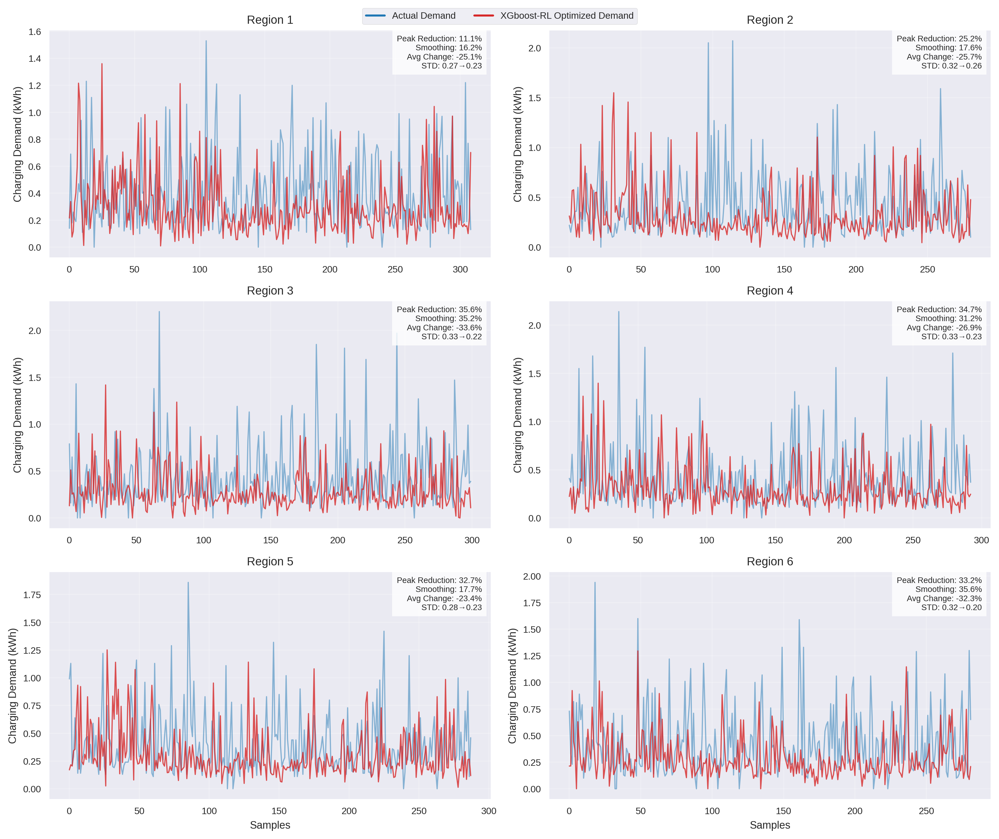


=== RL Optimization Results ===
Price Range: 0.200-0.400 €/kWh
Average Price: 0.372 €/kWh
Price Elasticity: -0.201
Demand Change: -26.9%


In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import MaxNLocator

# Configuration
DATA_PATH = '/content/drive/MyDrive/EVD/data/'
RL_RESULTS_PATH = DATA_PATH + 'saved_predictions/xgboost_rl_50000_Step_30000_data_results.pkl'
N_REGIONS = 6

def load_results(file_path):
    with open(file_path, 'rb') as f:
        return pickle.load(f)

# Load data and results
df = pd.read_csv(DATA_PATH + "helsinki_ev_data_price.csv")
df_shuffled = df.sample(frac=1, random_state=42).reset_index(drop=True)
df_subset = df_shuffled.head(30000)
rl_results = load_results(RL_RESULTS_PATH)

# Set professional style
plt.style.use('seaborn-v0_8')
plt.rcParams.update({
    'font.size': 9,
    'axes.titlesize': 10,
    'axes.labelsize': 9,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 8,
    'grid.alpha': 0.3,
    'figure.constrained_layout.use': True
})

def plot_rl_performance_2x3():
    """Plot of RL optimization performance in 2x3 grid"""
    # Prepare data
    y_true = rl_results['test_results']['y_true']
    rl_demands = np.concatenate(rl_results['rl_results']['demands'])[:len(y_true)]
    region_ids = df_subset['Region_ID'].values[:len(y_true)]

    # Create figure with 2 columns and 3 rows
    fig, axs = plt.subplots(3, 2, figsize=(12, 10), dpi=300)
    axs = axs.ravel()  # Flatten the array for easier indexing

    # Main title
    #fig.suptitle('Reinforcement Learning (RL) Approach Performance by Region', y=1.02, fontsize=11)

    # Color scheme
    colors = {
        'true': '#1f77b4',  # Blue
        'opt': '#d62728'    # Red
    }

    # Add legend at the top center
    handles = [
        plt.Line2D([], [], color=colors['true'], linestyle='-', label='Actual Demand'),
        plt.Line2D([], [], color=colors['opt'], linestyle='-', label='XGboost-RL Optimized Demand')
    ]
    fig.legend(handles=handles, loc='upper center', ncol=2,
               bbox_to_anchor=(0.5, 1.0), frameon=True)

    for region_id in range(1, N_REGIONS+1):
        ax = axs[region_id-1]  # Get current axis
        region_mask = (region_ids == region_id)

        if not any(region_mask):
            ax.axis('off')
            continue

        # Get data for this region
        y_region = y_true[region_mask]
        rl_region = rl_demands[region_mask]
        samples = np.arange(len(y_region))

        # Plot data
        ax.plot(samples, y_region, '-', color=colors['true'], alpha=0.5, label='Original', linewidth=1)
        ax.plot(samples, rl_region, '-', color=colors['opt'], alpha=0.8, label='Optimized', linewidth=1)

        # RL Metrics
        original_std = np.std(y_region)
        optimized_std = np.std(rl_region)
        smoothing = 100 * (1 - (optimized_std/original_std)) if original_std > 0 else 0
        peak_reduction = 100 * (1 - np.max(rl_region)/np.max(y_region)) if np.max(y_region) > 0 else 0
        avg_demand_change = 100 * ((np.mean(rl_region) - np.mean(y_region))/np.mean(y_region)) if np.mean(y_region) > 0 else 0

        rl_metric_text = (
            f'Peak Reduction: {peak_reduction:.1f}%\n'
            f'Smoothing: {smoothing:.1f}%\n'
            f'Avg Change: {avg_demand_change:+.1f}%\n'
            f'STD: {original_std:.2f}→{optimized_std:.2f}'
        )

        ax.text(0.98, 0.98,
                rl_metric_text,
                transform=ax.transAxes,
                ha='right', va='top',
                fontsize=7,
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        ax.set_title(f'Region {region_id}', pad=6)
        ax.set_ylabel('Charging Demand (kWh)')
        ax.grid(True, alpha=0.2)

        # Only show xlabel on bottom row
        if region_id in [5, 6]:
            ax.set_xlabel('Samples')

    plt.tight_layout()
    plt.savefig('rl_optimization_performance_2x3.pdf', bbox_inches='tight')
    plt.savefig('rl_optimization_performance_2x3.png', dpi=300)
    plt.show()

# Generate the RL performance plot in 2x3 layout
plot_rl_performance_2x3()

# Print key statistics
print("\n=== RL Optimization Results ===")
print(f"Price Range: {rl_results['rl_results']['price_stats']['min']:.3f}-{rl_results['rl_results']['price_stats']['max']:.3f} €/kWh")
print(f"Average Price: {rl_results['rl_results']['price_stats']['mean']:.3f} €/kWh")
print(f"Price Elasticity: {rl_results['rl_results']['elasticity']:.3f}")
rl_demand_change = 100 * (np.mean(np.concatenate(rl_results['rl_results']['demands'])) / np.mean(rl_results['test_results']['y_true']) - 1)
print(f"Demand Change: {rl_demand_change:.1f}%")

<ipython-input-5-56ee1f7db0bb>:101: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


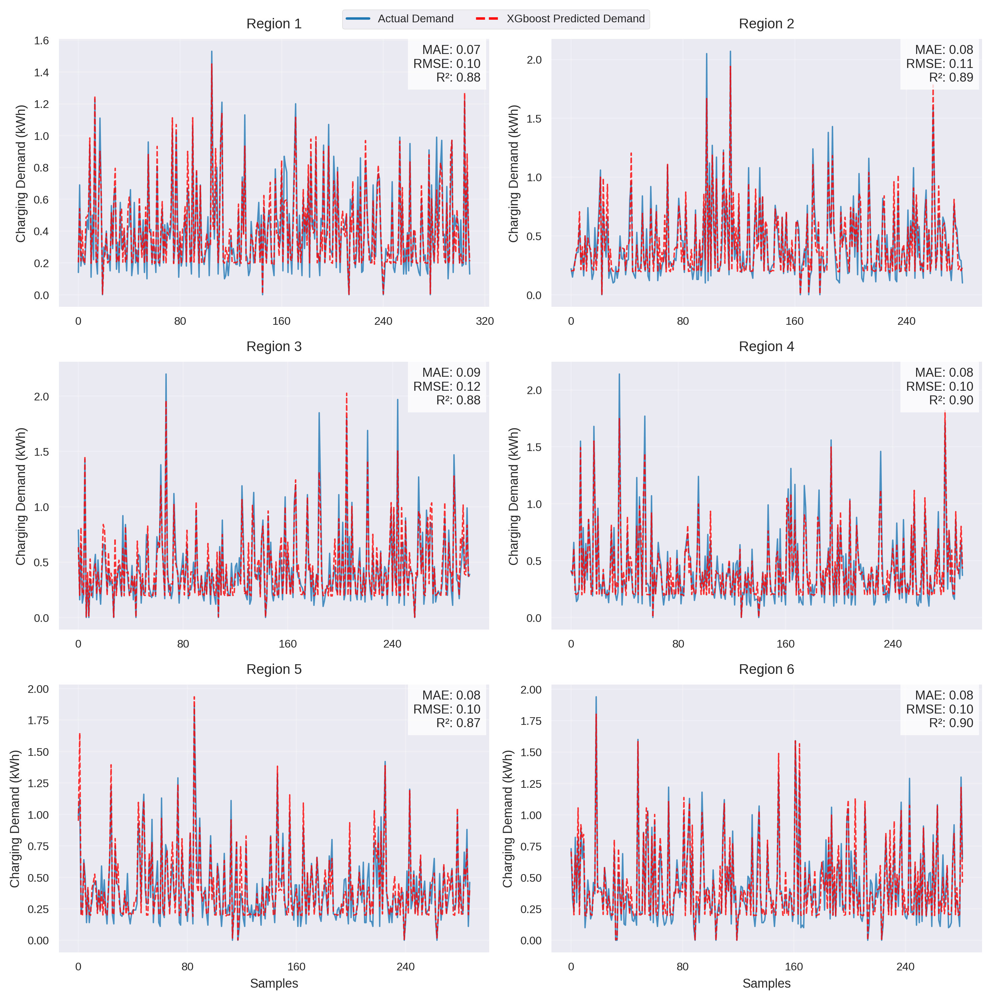


=== CatBoost-LP Model Performance Summary ===
Average MAE: 0.078 kWh
Average R²: 0.885


In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
from matplotlib.ticker import MaxNLocator

# Configuration
DATA_PATH = '/content/drive/MyDrive/EVD/data/'
RESULTS_PATH = DATA_PATH + 'saved_predictions/xgboost_rl_50000_Step_30000_data_results.pkl'
N_REGIONS = 6

def load_results(file_path):
    with open(file_path, 'rb') as f:
        return pickle.load(f)

# Load data and results
df = pd.read_csv(DATA_PATH + "helsinki_ev_data_price.csv")
df_shuffled = df.sample(frac=1, random_state=42).reset_index(drop=True)
df_subset = df_shuffled.head(30000)
results = load_results(RESULTS_PATH)

# Set professional style
plt.style.use('seaborn-v0_8')
plt.rcParams.update({
    'font.size': 9,
    'axes.titlesize': 10,
    'axes.labelsize': 9,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 8,
    'grid.alpha': 0.3,
    'figure.constrained_layout.use': True
})

def plot_prediction_performance():
    """Plot of prediction performance by region in 2x3 grid"""
    # Prepare data
    y_true = results['test_results']['y_true']
    y_pred = results['test_results']['y_pred']
    region_ids = df_subset['Region_ID'].values[:len(y_true)]

    # Create figure with 2 columns and 3 rows
    fig, axs = plt.subplots(3, 2, figsize=(10, 10), dpi=300)
    #fig.suptitle('CatBoost-LP Prediction Performance by Region', y=1.02, fontsize=12)

    # Flatten the axes array for easier iteration
    axs = axs.flatten()

    # Color scheme - changed 'pred' color to red
    colors = {
        'true': '#1f77b4',  # Blue
        'pred': '#ff0000'   # Red (changed from orange)
    }

    for region_id in range(1, N_REGIONS+1):
        ax = axs[region_id-1]  # Get the appropriate subplot
        region_mask = (region_ids == region_id)

        if not any(region_mask):
            ax.axis('off')
            continue

        # Get data for this region
        y_region = y_true[region_mask]
        pred_region = y_pred[region_mask]
        samples = np.arange(len(y_region))

        # Plot actual vs predicted
        ax.plot(samples, y_region, '-', color=colors['true'], alpha=0.8, label='Actual', linewidth=1)
        ax.plot(samples, pred_region, '--', color=colors['pred'], alpha=0.8, label='Predicted', linewidth=1)

        # Calculate and display metrics
        mae = mean_absolute_error(y_region, pred_region)
        rmse = np.sqrt(mean_squared_error(y_region, pred_region))
        r2 = r2_score(y_region, pred_region)

        ax.set_title(f'Region {region_id}', pad=8, fontsize=10)
        ax.set_ylabel('Charging Demand (kWh)', fontsize=9)
        ax.text(0.98, 0.98,
                f'MAE: {mae:.2f}\nRMSE: {rmse:.2f}\nR²: {r2:.2f}',
                transform=ax.transAxes,
                ha='right',
                va='top',
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        # Formatting
        ax.xaxis.set_major_locator(MaxNLocator(5))
        ax.grid(True, alpha=0.2)
        if region_id in [5, 6]:  # Only label x-axis for bottom row
            ax.set_xlabel('Samples', fontsize=9)

    # Add legend below the plots
    handles = [
        plt.Line2D([], [], color=colors['true'], linestyle='-', label='Actual Demand'),
        plt.Line2D([], [], color=colors['pred'], linestyle='--', label='XGboost Predicted Demand')
    ]
    fig.legend(handles=handles, loc='upper center', ncol=2,
               bbox_to_anchor=(0.5, 1.0), frameon=True)

    plt.tight_layout()
    plt.savefig('prediction_performance_grid.pdf', bbox_inches='tight')
    plt.savefig('prediction_performance_grid.png', dpi=300)
    plt.show()

# Generate the prediction performance plot
plot_prediction_performance()

# Print key statistics
print("\n=== CatBoost-LP Model Performance Summary ===")
print(f"Average MAE: {np.mean([res['mae'] for res in results['test_results']['metrics']]):.3f} kWh")
print(f"Average R²: {np.mean([res['r2'] for res in results['test_results']['metrics']]):.3f}")

<ipython-input-6-2690acbdc099>:39: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.3, wspace=0.2)
<ipython-input-6-2690acbdc099>:97: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 1600x600 with 0 Axes>

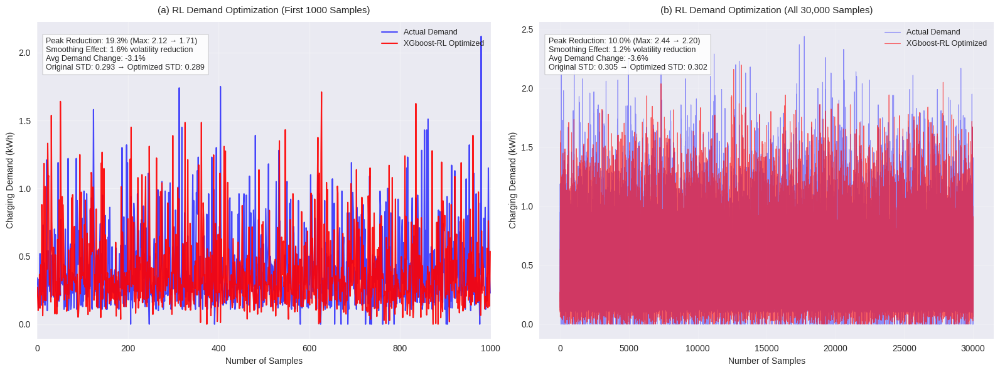


=== RL Optimization Statistics ===
Peak demand reduction: 10.0%
Average Price: 0.372 €/kWh
Price Elasticity: -0.201


In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

plt.figure(figsize=(16, 6))  # Adjusted figure size for 1 row of plots
plt.style.use('seaborn-v0_8')

# ==============================================
# Part 1: CatBoost-RL results
# ==============================================
with open('/content/drive/MyDrive/EVD/data/saved_predictions/xgboost_rl_50000_Step_30000_data_results.pkl', 'rb') as f:
    rl_results = pickle.load(f)

all_y_test_rl = rl_results['test_results']['y_true']

# Prepare data for all samples optimization plot
n_samples = len(all_y_test_rl)
all_original_demand_rl = []
all_rl_demands = []

k_folds = 10
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
X = pd.DataFrame(np.zeros((n_samples, 7)))

for fold, (_, val_idx) in enumerate(kf.split(X)):
    original_demand_fold = all_y_test_rl[val_idx]
    rl_demands_fold = rl_results['rl_results']['demands'][fold]
    min_length = min(len(original_demand_fold), len(rl_demands_fold))
    all_original_demand_rl.extend(original_demand_fold[:min_length])
    all_rl_demands.extend(rl_demands_fold[:min_length])

# ==============================================
# Create the RL plots only (1x2 grid)
# ==============================================
fig, axs = plt.subplots(1, 2, figsize=(16, 6))
plt.subplots_adjust(hspace=0.3, wspace=0.2)

# (a) RL first 1000 samples
axs[0].plot(all_y_test_rl[:1000], 'b-', alpha=0.7, label='Actual Demand', linewidth=1.5)
axs[0].plot(rl_results['rl_results']['demands'][0][:1000], 'r-', alpha=0.9, label='XGboost-RL Optimized', linewidth=1.5)
axs[0].set_xlabel('Number of Samples', fontsize=10)
axs[0].set_ylabel('Charging Demand (kWh)', fontsize=10)
axs[0].set_title('(a) RL Demand Optimization (First 1000 Samples)', fontsize=11, pad=10)
axs[0].legend(loc='upper right', fontsize=9, framealpha=1)
axs[0].grid(alpha=0.3)
axs[0].set_xlim(-1, 1001)

# Metrics for (a)
first_1000_actual_rl = all_y_test_rl[:1000]
first_1000_optimized_rl = rl_results['rl_results']['demands'][0][:1000]
peak_reduction_1000_rl = 100 * (1 - np.max(first_1000_optimized_rl)/np.max(first_1000_actual_rl))
original_std_1000_rl = np.std(first_1000_actual_rl)
optimized_std_1000_rl = np.std(first_1000_optimized_rl)
smoothing_1000_rl = 100 * (1 - (optimized_std_1000_rl/original_std_1000_rl))
avg_demand_change_1000_rl = 100 * ((np.mean(first_1000_optimized_rl) - np.mean(first_1000_actual_rl))/np.mean(first_1000_actual_rl))

metric_text_1000_rl = (
    f'Peak Reduction: {peak_reduction_1000_rl:.1f}% (Max: {np.max(first_1000_actual_rl):.2f} → {np.max(first_1000_optimized_rl):.2f})\n'
    f'Smoothing Effect: {smoothing_1000_rl:.1f}% volatility reduction\n'
    f'Avg Demand Change: {avg_demand_change_1000_rl:+.1f}%\n'
    f'Original STD: {original_std_1000_rl:.3f} → Optimized STD: {optimized_std_1000_rl:.3f}'
)
axs[0].text(0.02, 0.95, metric_text_1000_rl, transform=axs[0].transAxes,
          bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
          fontsize=9, verticalalignment='top')

# (b) RL all samples
axs[1].plot(all_original_demand_rl, 'b-', alpha=0.4, label='Actual Demand', linewidth=0.8)
axs[1].plot(all_rl_demands, 'r-', alpha=0.6, label='XGboost-RL Optimized', linewidth=0.8)
axs[1].set_xlabel('Number of Samples', fontsize=10)
axs[1].set_ylabel('Charging Demand (kWh)', fontsize=10)
axs[1].set_title('(b) RL Demand Optimization (All 30,000 Samples)', fontsize=11, pad=10)
axs[1].legend(loc='upper right', fontsize=9, framealpha=1)
axs[1].grid(alpha=0.2)

# Metrics for (b)
peak_reduction_rl = 100 * (1 - np.max(all_rl_demands)/np.max(all_original_demand_rl))
original_std_rl = np.std(all_original_demand_rl)
optimized_std_rl = np.std(all_rl_demands)
smoothing_rl = 100 * (1 - (optimized_std_rl/original_std_rl))
avg_demand_change_rl = 100 * ((np.mean(all_rl_demands) - np.mean(all_original_demand_rl))/np.mean(all_original_demand_rl))

metric_text_rl = (
    f'Peak Reduction: {peak_reduction_rl:.1f}% (Max: {np.max(all_original_demand_rl):.2f} → {np.max(all_rl_demands):.2f})\n'
    f'Smoothing Effect: {smoothing_rl:.1f}% volatility reduction\n'
    f'Avg Demand Change: {avg_demand_change_rl:+.1f}%\n'
    f'Original STD: {original_std_rl:.3f} → Optimized STD: {optimized_std_rl:.3f}'
)
axs[1].text(0.02, 0.95, metric_text_rl, transform=axs[1].transAxes,
         bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
         fontsize=9, verticalalignment='top')

# Save and show
plt.tight_layout()
plt.savefig('rl_optimization_results.png', dpi=300, bbox_inches='tight')
plt.show()

# Print optimization statistics
print("\n=== RL Optimization Statistics ===")
print(f"Peak demand reduction: {peak_reduction_rl:.1f}%")
print(f"Average Price: {rl_results['rl_results']['price_stats']['mean']:.3f} €/kWh")
print(f"Price Elasticity: {rl_results['rl_results']['elasticity']:.3f}")

<ipython-input-7-e01ec8552cfc>:63: UserWarning: The figure layout has changed to tight
  plt.tight_layout(pad=3.0)


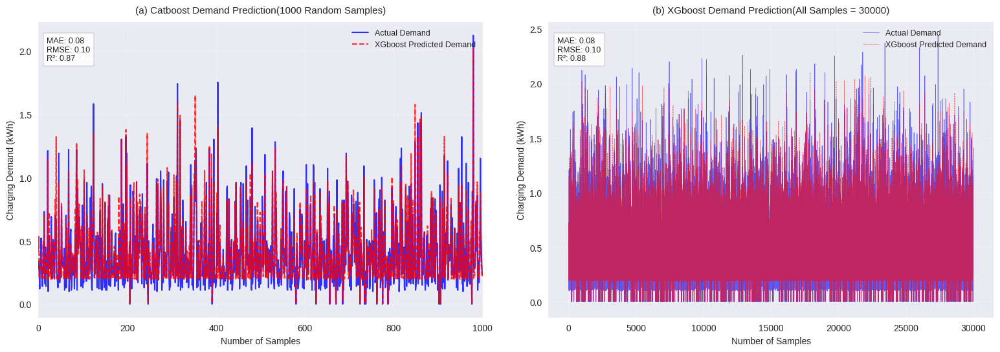


=== Model Performance Metrics ===
Average MAE: 0.0780
Average RMSE: 0.1035
Average R²: 0.8848


In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Set up the figure and subplots
plt.figure(figsize=(16, 6))
plt.style.use('seaborn-v0_8')

# 1. Load data and results
df = pd.read_csv('/content/drive/MyDrive/EVD/data/helsinki_ev_data_price.csv')
df_subset = df.head(30000)

with open('/content/drive/MyDrive/EVD/data/saved_predictions/xgboost_rl_50000_Step_30000_data_results.pkl', 'rb') as f:
    results = pickle.load(f)

all_y_test = results['test_results']['y_true']
all_test_preds = results['test_results']['y_pred']

# 1. (a) Left: Prediction comparison (first 1000 samples)
ax1 = plt.subplot(1, 2, 1)
ax1.plot(all_y_test[:1000], 'b-', linewidth=1.5, alpha=0.8, label='Actual Demand')
ax1.plot(all_test_preds[:1000], 'r--', linewidth=1.5, alpha=0.8, label='XGboost Predicted Demand')
ax1.set_xlabel('Number of Samples', fontsize=10)
ax1.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax1.set_title('(a) Catboost Demand Prediction(1000 Random Samples)', fontsize=11, pad=10)
ax1.legend(loc='upper right', fontsize=9, framealpha=1)
ax1.grid(True, linestyle='--', alpha=0.3)
ax1.set_xlim(-1, 1001)

# Metrics for (a)
mae_1000 = mean_absolute_error(all_y_test[:1000], all_test_preds[:1000])
rmse_1000 = np.sqrt(mean_squared_error(all_y_test[:1000], all_test_preds[:1000]))
r2_1000 = r2_score(all_y_test[:1000], all_test_preds[:1000])

metrics_text_1000 = (f'MAE: {mae_1000:.2f}\nRMSE: {rmse_1000:.2f}\nR²: {r2_1000:.2f}')
ax1.text(0.02, 0.95, metrics_text_1000, transform=ax1.transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=9, verticalalignment='top')

# 2. (b) Right: Prediction comparison (all samples)
ax2 = plt.subplot(1, 2, 2)
ax2.plot(all_y_test, 'b-', linewidth=0.5, alpha=0.6, label='Actual Demand')
ax2.plot(all_test_preds, 'r--', linewidth=0.5, alpha=0.6, label='XGboost Predicted Demand')
ax2.set_xlabel('Number of Samples', fontsize=10)
ax2.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax2.set_title('(b) XGboost Demand Prediction(All Samples = 30000)', fontsize=11, pad=10)
ax2.legend(loc='upper right', fontsize=9, framealpha=1)
ax2.grid(True, linestyle='--', alpha=0.3)

# Metrics for (b)
mae_all = mean_absolute_error(all_y_test, all_test_preds)
rmse_all = np.sqrt(mean_squared_error(all_y_test, all_test_preds))
r2_all = r2_score(all_y_test, all_test_preds)

metrics_text_all = (f'MAE: {mae_all:.2f}\nRMSE: {rmse_all:.2f}\nR²: {r2_all:.2f}')
ax2.text(0.02, 0.95, metrics_text_all, transform=ax2.transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=9, verticalalignment='top')

# Adjust layout and save
plt.tight_layout(pad=3.0)
plt.savefig('prediction_results.png', dpi=300, bbox_inches='tight')
plt.show()

# Print metrics
print("\n=== Model Performance Metrics ===")
print(f"Average MAE: {results['avg_test_metrics']['mae']:.4f}")
print(f"Average RMSE: {results['avg_test_metrics']['rmse']:.4f}")
print(f"Average R²: {results['avg_test_metrics']['r2']:.4f}")